In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path.append('../src')

In [3]:
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns
import numpy as np
import pandas as pd
import anndata

In [4]:
from spaceoracle.models.estimators import GCNNWR 
from spaceoracle.tools.data import load_example_slideseq, filter_adata
from spaceoracle.tools.network import GeneRegulatoryNetwork

In [5]:
# slideseq_data = load_example_slideseq('../data/slideseq/')
# slideseq_data

In [6]:
# adata_train = slideseq_data[1][1].copy()
# adata_test = slideseq_data[3][1].copy()

# slideseq_data[1][0], slideseq_data[3][0]

In [7]:
# rctd_results_1 = pd.read_csv('../data/slideseq/day5_1_rctd.csv', index_col=0)
# rctd_results_2 = pd.read_csv('../data/slideseq/day5_2_rctd.csv', index_col=0)

In [8]:
# adata_train = adata_train[adata_train.obs.index.isin(rctd_results_1.index)]
# adata_train.obsm['rctd_results'] = adata_train.obs.join(rctd_results_1)
# adata_train.obsm['rctd_results'].first_type = adata_train.obsm['rctd_results'].first_type - 1
# adata_train.obsm['rctd_results'].first_type = adata_train.obsm['rctd_results'].first_type.astype(int)
# adata_train.obsm['rctd_results'].first_type = adata_train.obsm['rctd_results'].first_type.astype('category')
# adata_train = adata_train[adata_train.obsm['rctd_results'].spot_class == 'singlet']
# adata_train.obs['rctd_cluster'] = adata_train.obsm['rctd_results'].first_type
# adata_train

In [9]:
# adata_test = adata_test[adata_test.obs.index.isin(rctd_results_2.index)]
# adata_test.obsm['rctd_results'] = adata_test.obs.join(rctd_results_2)
# adata_test.obsm['rctd_results'].first_type = adata_test.obsm['rctd_results'].first_type - 1
# adata_test.obsm['rctd_results'].first_type = adata_test.obsm['rctd_results'].first_type.astype(int)
# adata_test.obsm['rctd_results'].first_type = adata_test.obsm['rctd_results'].first_type.astype('category')
# adata_test = adata_test[adata_test.obsm['rctd_results'].spot_class == 'singlet']
# adata_test.obs['rctd_cluster'] = adata_test.obsm['rctd_results'].first_type
# adata_test

In [10]:
# adata_train.write_h5ad('../data/slideseq/day5_1.h5ad')
# adata_test.write_h5ad('../data/slideseq/day5_2.h5ad')

In [12]:
adata_train = anndata.read_h5ad('../data/slideseq/day3_1.h5ad')
adata_test = anndata.read_h5ad('../data/slideseq/day3_2.h5ad')

# adata_train = anndata.read_h5ad('../data/slideseq/day5_1.h5ad')
# adata_test = anndata.read_h5ad('../data/slideseq/day5_2.h5ad')

In [13]:
n_top_genes = 8000
min_cells = 10
min_counts = 100

adata_train.var_names_make_unique()
adata_train.var["mt"] = adata_train.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(adata_train, qc_vars=["mt"], inplace=True)
sc.pp.filter_cells(adata_train, min_counts=min_counts)
adata_train = adata_train[adata_train.obs["pct_counts_mt"] < 20].copy()
adata_train = adata_train[:, ~adata_train.var["mt"]]
sc.pp.filter_genes(adata_train, min_cells=min_cells)

adata_train.layers["raw_count"] = adata_train.X

sc.pp.normalize_total(adata_train, inplace=True)
sc.pp.log1p(adata_train)
sc.pp.highly_variable_genes(
    adata_train, flavor="seurat", n_top_genes=n_top_genes)

adata_train = adata_train[:, adata_train.var.highly_variable]
adata_train

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


View of AnnData object with n_obs × n_vars = 15870 × 8000
    obs: 'cluster', 'rctd_cluster', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cluster_colors', 'rctd_cluster_colors', 'log1p', 'hvg'
    obsm: 'X_spatial', 'rctd_results', 'spatial'
    layers: 'raw_count'

In [14]:
adata_test.var_names_make_unique()
adata_test.var["mt"] = adata_test.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(adata_test, qc_vars=["mt"], inplace=True)
sc.pp.filter_cells(adata_test, min_counts=min_counts)
adata_test = adata_test[adata_test.obs["pct_counts_mt"] < 20].copy()
adata_test = adata_test[:, ~adata_test.var["mt"]]
sc.pp.filter_genes(adata_test, min_cells=min_cells)

adata_test.layers["raw_count"] = adata_test.X

sc.pp.normalize_total(adata_test, inplace=True)
sc.pp.log1p(adata_test)
sc.pp.highly_variable_genes(
    adata_test, flavor="seurat", n_top_genes=n_top_genes)

adata_test = adata_test[:, adata_test.var.highly_variable]
adata_test

View of AnnData object with n_obs × n_vars = 13680 × 8000
    obs: 'cluster', 'rctd_cluster', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    obsm: 'X_spatial', 'rctd_results', 'spatial'
    layers: 'raw_count'

In [32]:
adata_train.obs['rctd_cluster'] = adata_train.obs['rctd_cluster'].cat.rename_categories({
    0: "B-cell",
    1: "Cd8 T-cell", 
    2: "Th2",
    3: "Resting T-cell",
    4: "Tfh",
    5: "Treg",
    6: "NK"
})

adata_test.obs['rctd_cluster'] = adata_test.obs['rctd_cluster'].cat.rename_categories({
    0: "B-cell",
    1: "Cd8 T-cell", 
    2: "Th2",
    3: "Resting T-cell",
    4: "Tfh",
    5: "Treg",
    6: "NK"
})

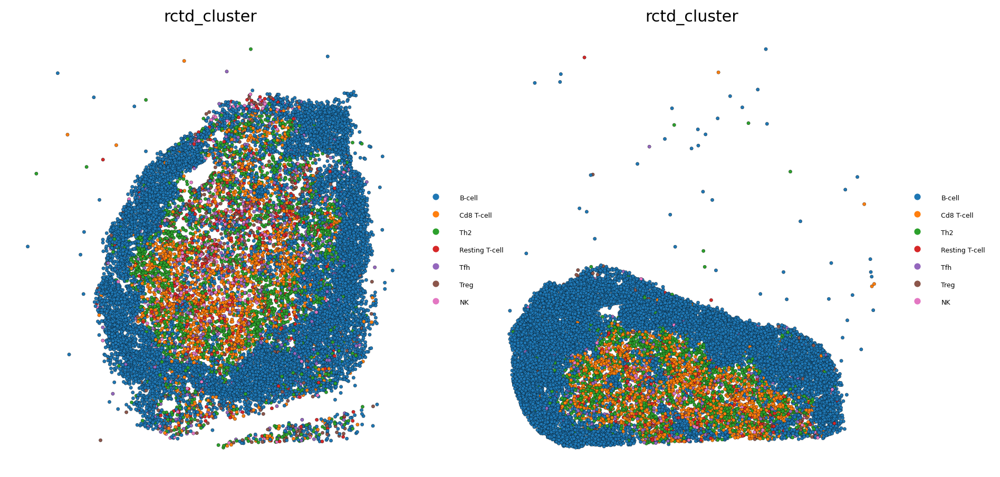

In [33]:
%matplotlib inline
plt.rcParams["figure.figsize"] = (5, 5)
plt.rcParams['figure.dpi'] = 180

f, axs = plt.subplots(1, 2, figsize=(12, 6), dpi=180)

sc.pl.embedding(adata_train, color='rctd_cluster', basis="spatial", s=25, show=False, edgecolor='black', linewidth=0.15, ax=axs[0])
sc.pl.embedding(adata_test, color='rctd_cluster', basis="spatial", s=25, show=False, edgecolor='black', linewidth=0.15, ax=axs[1])


fig = plt.gcf()
ax = plt.gca()

for ax in axs:
    ax.set_frame_on(False)  
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_ylabel('')
    ax.set_xlabel('')
    
    legend = ax.get_legend()
    for text in legend.get_texts():
        text.set_fontsize(5)
    
    for handle in legend.legendHandles:
        handle._sizes = [15]

# plt.title('')
# plt.axis('off')
plt.show()

In [75]:
def count_nearby_b_cells(adata, target_celltype='Tfh', 
neighbor_celltype='B-cell', radius=50):
    """
    Count the number of B-cells within a given radius of each Th2 cell.
    
    Parameters:
    - adata: AnnData object containing spatial information and cell type annotations
    - target_celltype: Cell type to analyze (default: 'Th2')
    - neighbor_celltype: Cell type to count as neighbors (default: 'B-cell')
    - radius: Euclidean distance threshold for considering cells as neighbors (default: 50)
    
    Returns:
    - pd.DataFrame with columns: cell_id, x, y, n_neighbors
    """
    import pandas as pd
    from scipy.spatial.distance import cdist
    
    # Extract spatial coordinates and cell type information
    spatial_coords = adata.obsm['spatial']
    cell_types = adata.obs['rctd_cluster']
    
    # Get indices of target and neighbor cells
    target_indices = cell_types == target_celltype
    neighbor_indices = cell_types == neighbor_celltype
    
    # Extract coordinates for target and neighbor cells
    target_coords = spatial_coords[target_indices]
    neighbor_coords = spatial_coords[neighbor_indices]
    
    # Calculate pairwise distances between target and neighbor cells
    distances = cdist(target_coords, neighbor_coords)
    
    # Count neighbors within the specified radius
    neighbor_counts = (distances <= radius).sum(axis=1)
    
    # Create DataFrame with results
    result_df = pd.DataFrame({
        'cell_id': adata.obs_names[target_indices],
        'x': target_coords[:, 0],
        'y': target_coords[:, 1],
        'n_neighbors': neighbor_counts
    })
    
    return result_df


In [89]:
# Example usage:
th2_neighbors_train = count_nearby_b_cells(adata_train.copy(), radius=50)

In [90]:
adata_train.obs['Tfh-BCell'] = 0

In [91]:
for cell_id, n_neighbors in th2_neighbors_train.query('n_neighbors > 1')[['cell_id', 'n_neighbors']].values:
    adata_train.obs.loc[cell_id, 'Tfh-BCell'] = n_neighbors


In [92]:
adata_train.obs['Tfh-BCell'].value_counts()

Tfh-BCell
0     15592
2        48
3        42
4        28
5        21
7        17
6        14
10       12
12       11
11       11
9         8
16        8
13        8
14        8
8         8
15        7
17        7
20        6
19        4
21        4
18        4
22        1
23        1
Name: count, dtype: int64

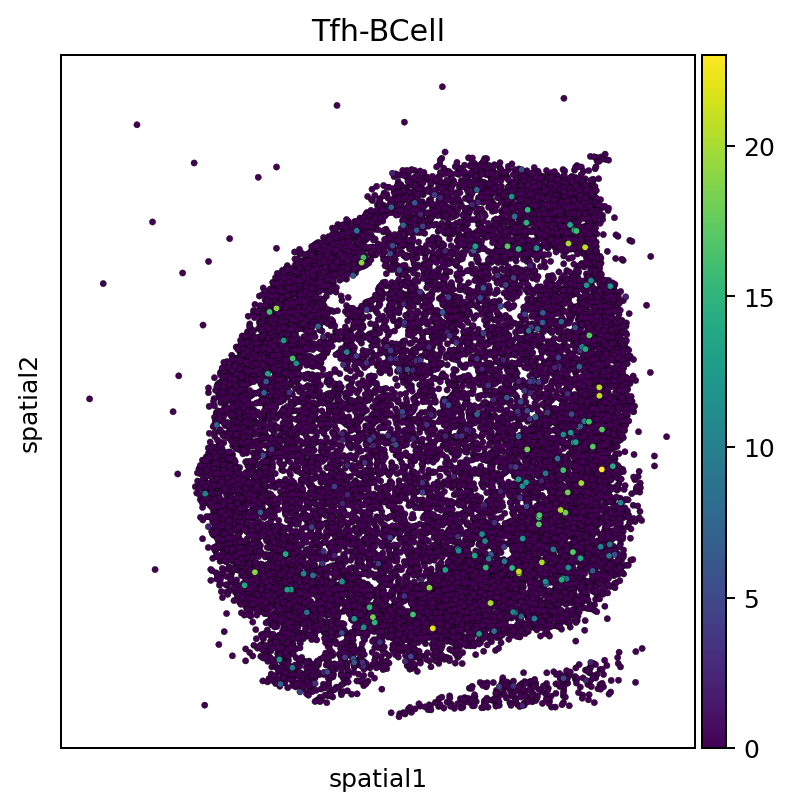

In [93]:
sc.pl.embedding(adata_train, color='Tfh-BCell', basis="spatial", s=25, 
    show=True, edgecolor='black', linewidth=0.15)

In [222]:
'Ccl5' in np.intersect1d(adata_train.var_names, adata_test.var_names)

True

In [223]:
adata_train = adata_train[:, adata_train.var_names.isin(np.intersect1d(adata_train.var_names, adata_test.var_names))]
adata_test = adata_test[:, adata_test.var_names.isin(np.intersect1d(adata_train.var_names, adata_test.var_names))]

adata_train, adata_test

(View of AnnData object with n_obs × n_vars = 20099 × 5899
     obs: 'cluster', 'rctd_cluster', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts'
     var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
     uns: 'log1p', 'hvg', 'rctd_cluster_colors'
     obsm: 'X_spatial', 'rctd_results', 'spatial'
     layers: 'raw_count',
 View of AnnData object with n_obs × n_vars = 16823 × 5899
     obs: 'cluster', 'rctd_cluster', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_t

In [232]:
adata_train.to_df()[[i for i in adata_train.var_names if 'Cd' in i]].mean(0).sort_values(ascending=False)[:20]

Cd79b       0.178647
Cd74        0.121133
Cd3d        0.076171
Cd22        0.052784
Cd2         0.052183
Cd53        0.051441
Cd63        0.046126
Cd247       0.040617
Cd19        0.038782
Cdk2ap2     0.038090
Cd48        0.036292
Cd8b1       0.034405
Cd83        0.033555
Cdc42se1    0.032915
Cd3g        0.032800
Cd47        0.032329
Cd8a        0.029547
Cdc42se2    0.028158
Cd81        0.024053
Cdc5l       0.021757
dtype: float32

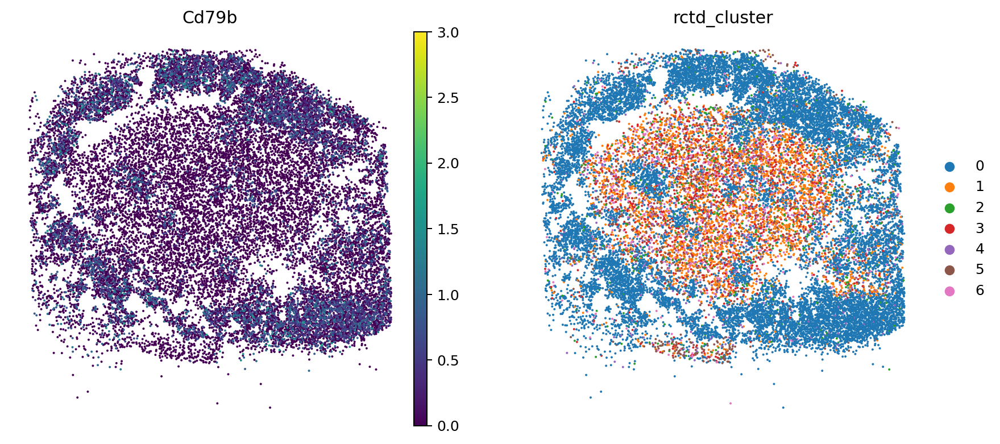

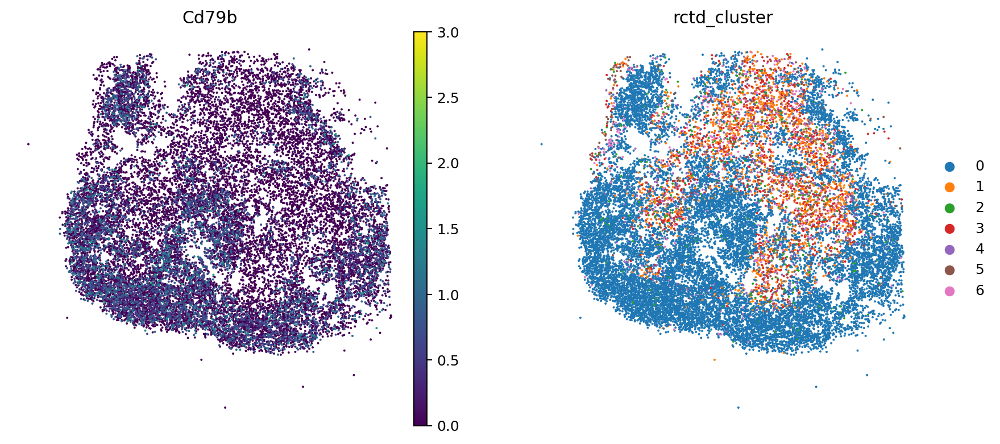

In [239]:
plt.rcParams["figure.figsize"] = (5, 5)
plt.rcParams['figure.dpi'] = 180
sc.pl.embedding(adata_train, color=['Cd79b', 'rctd_cluster'], 
                frameon=False, basis="spatial", s=10, show=False, vmin=0, vmax=3)
plt.axis('off')
plt.show()

sc.pl.embedding(adata_test, color=['Cd79b', 'rctd_cluster'], 
                frameon=False, basis="spatial", s=10, show=False, vmin=0, vmax=3)
plt.axis('off')
plt.show()

In [240]:
grn = GeneRegulatoryNetwork()

In [241]:
target_gene = 'Cd79b'

In [242]:
regulators = grn.get_regulators(adata_train, target_gene=target_gene)
regulators, len(regulators)

(['Arid2',
  'Bcl3',
  'Bhlhe40',
  'Ctcf',
  'Egr1',
  'Ets1',
  'Irf1',
  'Itgb2',
  'Klf2',
  'Klf3',
  'Klf6',
  'Maff',
  'Mafk',
  'Mef2a',
  'Mef2c',
  'Meox2',
  'Nr2f2',
  'Prrx1',
  'Smad3',
  'Sp1',
  'Stat1',
  'Stat3',
  'Stat4',
  'Stat5a',
  'Stat5b',
  'Tcf12',
  'Tcf7l2',
  'Tead2',
  'Tfap4',
  'Zbtb7a'],
 30)

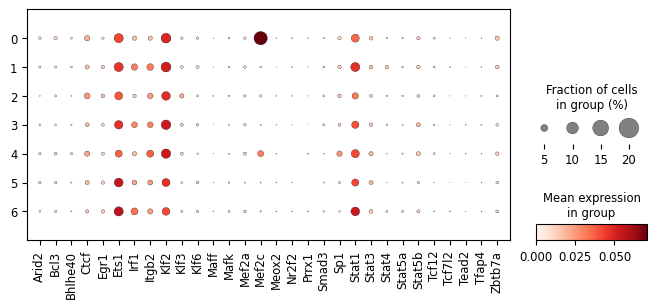

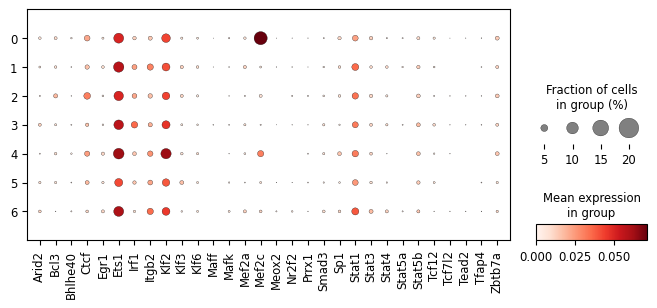

In [243]:
plt.rcParams["figure.figsize"] = (5, 3)
plt.rcParams['figure.dpi'] = 100
sc.pl.dotplot(adata_train, var_names=regulators, groupby='rctd_cluster', figsize=(8, 3))
sc.pl.dotplot(adata_test, var_names=regulators, groupby='rctd_cluster', figsize=(8, 3))

In [244]:
from spaceoracle.models.estimators import GeoCNNEstimator

In [245]:
estimator = GeoCNNEstimator()

In [246]:
regulators

['Arid2',
 'Bcl3',
 'Bhlhe40',
 'Ctcf',
 'Egr1',
 'Ets1',
 'Irf1',
 'Itgb2',
 'Klf2',
 'Klf3',
 'Klf6',
 'Maff',
 'Mafk',
 'Mef2a',
 'Mef2c',
 'Meox2',
 'Nr2f2',
 'Prrx1',
 'Smad3',
 'Sp1',
 'Stat1',
 'Stat3',
 'Stat4',
 'Stat5a',
 'Stat5b',
 'Tcf12',
 'Tcf7l2',
 'Tead2',
 'Tfap4',
 'Zbtb7a']

In [247]:
X = adata_train.to_df()[regulators]
y = adata_train.to_df()[[target_gene]]
xy = adata_train.obsm['spatial']

In [248]:
adata_train.shape, adata_train.obs['rctd_cluster'].shape

((20099, 5899), (20099,))

In [260]:
estimator.fit(
    X.values[:, :], 
    y.values[:], 
    xy[:, :], 
    labels = np.array(adata_train.obs['rctd_cluster'].values[:]),
    init_betas='ones', 
    max_epochs=150, 
    learning_rate=3e-4, 
    spatial_dim=64,
    in_channels=7,
    mode = 'train_test',
)

/scratch/slurm-955489/ipykernel_6922/1595208164.py:1: DeprecatedWarning: fit is a deprecated function. Please use GeoCNNEstimatorV2 instead.
  estimator.fit(
/ihome/ylee/kor11/space/SpaceOracle/notebooks/../src/spaceoracle/models/estimators.py:217: DeprecatedWarning: _build_dataloaders is a deprecated function. Please use the SpatialDataset class instead.
  train_dataloader, valid_dataloader = _build_dataloaders(
[cuda] MSE: 0.1033 | Baseline: 1.8468: 100%|██████████| 150/150 [05:59<00:00,  2.40s/it]

Best model at 76/150


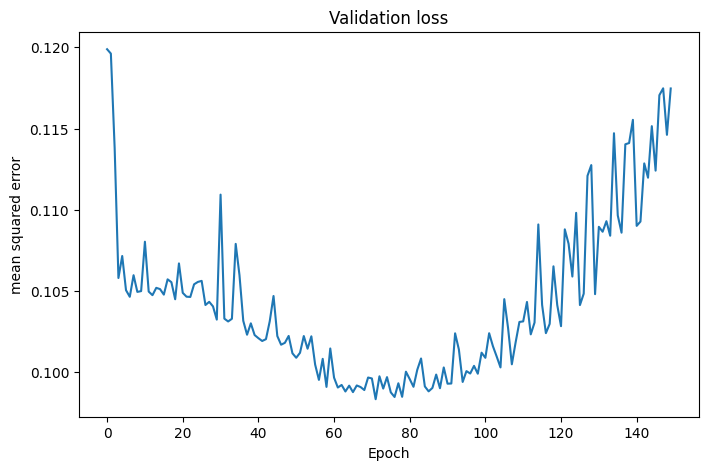

In [251]:
plt.rcParams["figure.figsize"] = (8, 5)
plt.rcParams['figure.dpi'] = 100
plt.plot(estimator.losses)
plt.xlabel('Epoch')
plt.ylabel('mean squared error')
plt.title('Validation loss')
plt.show()

In [252]:
betas, y_pred = estimator.get_betas(
    X.values[:, :], xy[:, :], np.array(adata_train.obs['rctd_cluster'].values[:]))

/ihome/ylee/kor11/space/SpaceOracle/notebooks/../src/spaceoracle/models/estimators.py:302: DeprecatedWarning: _build_dataloaders is a deprecated function. Please use the SpatialDataset class instead.
  infer_dataloader = _build_dataloaders(


In [253]:
X_test = adata_test.to_df()[regulators]
y_test = adata_test.to_df()[[target_gene]]
xy_test = adata_test.obsm['spatial']

betas_test, y_pred_test = estimator.get_betas(
    X_test.values[:, :], xy_test[:, :], np.array(adata_test.obs['rctd_cluster'].values[:]))

/ihome/ylee/kor11/space/SpaceOracle/notebooks/../src/spaceoracle/models/estimators.py:302: DeprecatedWarning: _build_dataloaders is a deprecated function. Please use the SpatialDataset class instead.
  infer_dataloader = _build_dataloaders(


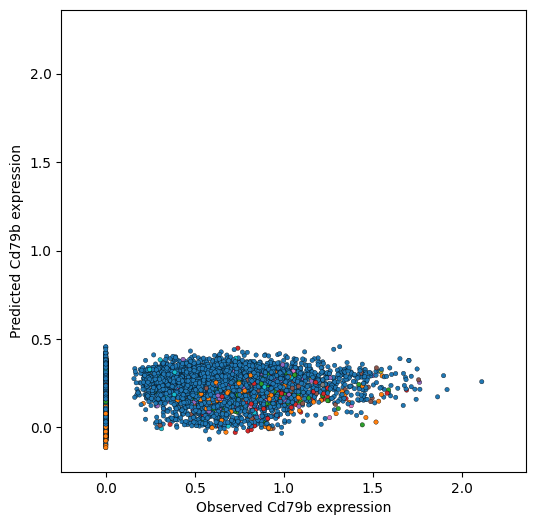

In [254]:
plt.rcParams["figure.figsize"] = (6, 6)
plt.rcParams['figure.dpi'] = 100
sns.scatterplot(
    x=y.values[:, :].reshape(-1), 
    y=y_pred.reshape(-1), s=10, 
    c=adata_train.obs.cluster.values[:], cmap='tab10', edgecolor='black', linewidth=0.25)
plt.xlim(y.values[:, :].min()-0.25, y.values[:, :].max()+0.25)
plt.ylim(y.values[:, :].min()-0.25, y.values[:, :].max()+0.25)
plt.xlabel(f'Observed {target_gene} expression')
plt.ylabel(f'Predicted {target_gene} expression')
plt.show()

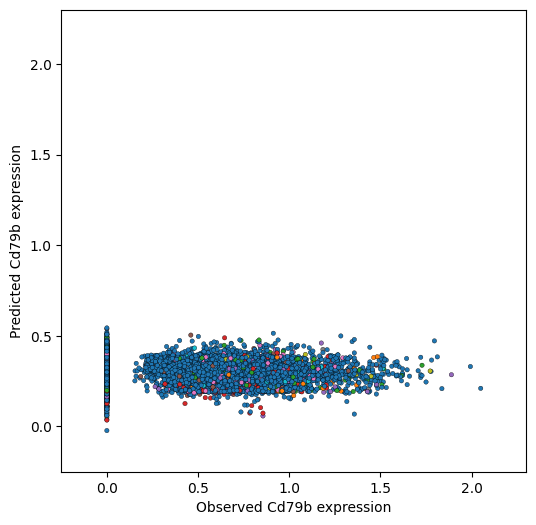

In [255]:
plt.rcParams["figure.figsize"] = (6, 6)
plt.rcParams['figure.dpi'] = 100
sns.scatterplot(
    x=y_test.values[:, :].reshape(-1), 
    y=y_pred_test.reshape(-1), s=10, 
    c=adata_test.obs.cluster.values[:], cmap='tab10', edgecolor='black', linewidth=0.25)
plt.xlim(y_test.values[:, :].min()-0.25, y_test.values[:, :].max()+0.25)
plt.ylim(y_test.values[:, :].min()-0.25, y_test.values[:, :].max()+0.25)
plt.xlabel(f'Observed {target_gene} expression')
plt.ylabel(f'Predicted {target_gene} expression')
plt.show()

In [256]:
from matplotlib.colors import CenteredNorm, Normalize, TwoSlopeNorm

[autoreload of spaceoracle.models.estimators failed: Traceback (most recent call last):
  File "/ihome/ylee/kor11/.local/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 276, in check
    superreload(m, reload, self.old_objects)
  File "/ihome/ylee/kor11/.local/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 500, in superreload
    update_generic(old_obj, new_obj)
  File "/ihome/ylee/kor11/.local/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 397, in update_generic
    update(a, b)
  File "/ihome/ylee/kor11/.local/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 349, in update_class
    if update_generic(old_obj, new_obj):
  File "/ihome/ylee/kor11/.local/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 397, in update_generic
    update(a, b)
  File "/ihome/ylee/kor11/.local/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 309, in update_function
    setattr(old, name, g

In [257]:
len(regulators)

30

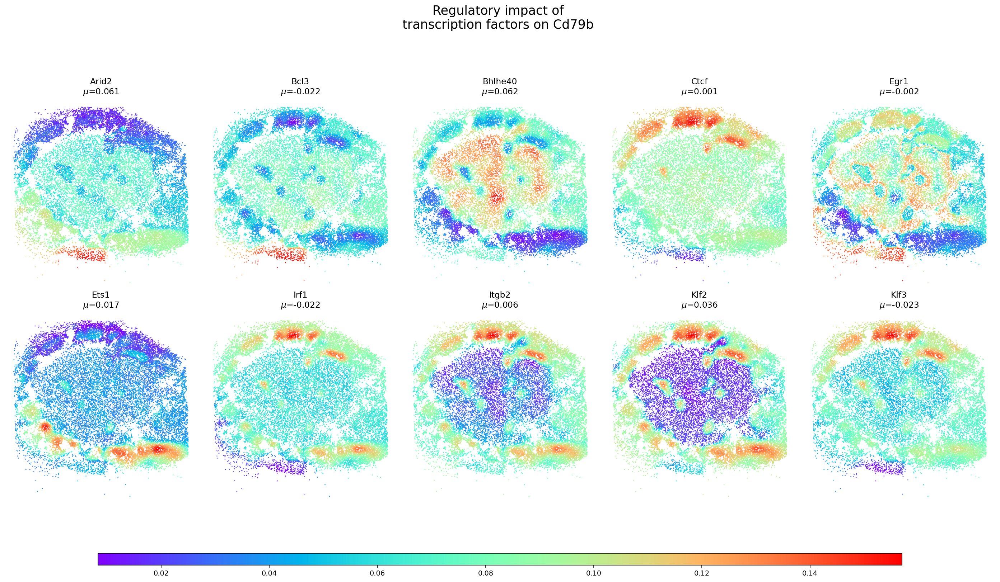

In [258]:
f, axs = plt.subplots(2, 5, figsize=(20, 12), dpi=140, sharex=True, sharey=True)
axs = axs.flatten()

scatter_plots = []

for i in range(len(axs)): 
    scatter = sns.scatterplot(x=adata_train.obsm['spatial'][:, 0], y=adata_train.obsm['spatial'][:, 1], 
                s=2, c=betas[:, i+1], cmap='rainbow', 
                ax=axs[i], edgecolor=None, linewidth=0, 
    )
    scatter_plots.append(scatter)

beta_means = list(betas.mean(0))
for ix, ax in enumerate(axs):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_title(f'{regulators[ix]}\n'+ r'$\mu$' + f'={beta_means[ix+1]:.3f}')
    ax.set_xticks([])
    ax.set_yticks([])
    
    
plt.tight_layout()
f.subplots_adjust(bottom=0.15)

# Add a colorbar
cbar_ax = f.add_axes([0.1, 0.05, 0.8, 0.02])
colorbar = f.colorbar(
    scatter_plots[0].collections[0], cax=cbar_ax, orientation='horizontal')


plt.suptitle(f'Regulatory impact of \ntranscription factors on {target_gene} ', fontsize=18)
plt.subplots_adjust(top=0.825)

plt.show()

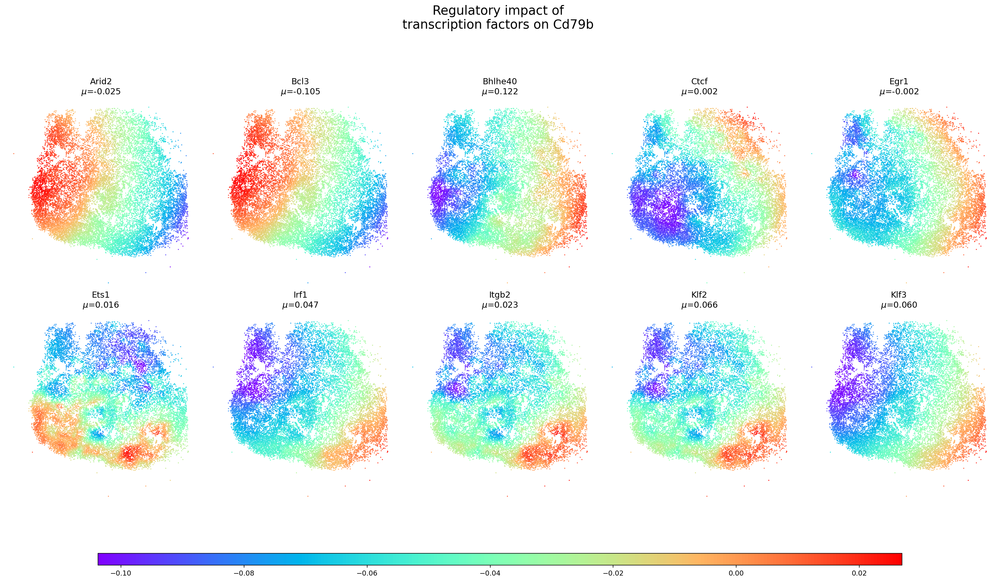

In [259]:
f, axs = plt.subplots(2, 5, figsize=(20, 12), dpi=140, sharex=True, sharey=True)
axs = axs.flatten()

scatter_plots = []

for i in range(len(axs)): 
    scatter = sns.scatterplot(x=adata_test.obsm['spatial'][:, 0], y=adata_test.obsm['spatial'][:, 1], 
                s=2, c=betas_test[:, i+1], cmap='rainbow', 
                ax=axs[i], edgecolor=None, linewidth=0, 
    )
    scatter_plots.append(scatter)

beta_means = list(betas_test.mean(0))
for ix, ax in enumerate(axs):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_title(f'{regulators[ix]}\n'+ r'$\mu$' + f'={beta_means[ix+1]:.3f}')
    ax.set_xticks([])
    ax.set_yticks([])
    
    
plt.tight_layout()
f.subplots_adjust(bottom=0.15)

# Add a colorbar
cbar_ax = f.add_axes([0.1, 0.05, 0.8, 0.02])
colorbar = f.colorbar(
    scatter_plots[0].collections[0], cax=cbar_ax, orientation='horizontal')


plt.suptitle(f'Regulatory impact of \ntranscription factors on {target_gene} ', fontsize=18)
plt.subplots_adjust(top=0.825)

plt.show()